In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

#Data Collection and Processing

In [2]:
#Load the dataset
df=pd.read_csv(r"C:\Users\anike\Downloads\Dataset .csv")
df

#Display the first few rows of the dataframe
df.head()

# Check the structure and data types
df.info()

# Summary statistics
df.describe()

# check for missing values
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

# Level 2 Tasks

#Task 1:Restaurant Ratings

In [3]:
# Analyze the distribution of aggregate ratings and determine the most common rating range
rating_distribution = df['Aggregate rating'].value_counts().sort_index()

# Calculate the average number of votes received by restaurants
average_votes = df['Votes'].mean()

print("Rating distribution:\n", rating_distribution)
print("Average number of votes:", average_votes)

Rating distribution:
 Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64
Average number of votes: 156.909747670401


#Task 2: Cuisine Combinati

In [4]:
# Identify the most common combinations of cuisines in the dataset
from itertools import combinations
from collections import Counter

# Split the cuisines and create combinations
cuisine_combinations = df['Cuisines'].dropna().apply(lambda x: list(combinations(x.split(','), 2)))
all_combinations = [item for sublist in cuisine_combinations for item in sublist]
common_combinations = Counter(all_combinations).most_common(10)

print("Most common cuisine combinations:\n", common_combinations)

# Calculate the average rating for each unique cuisine
cuisine_ratings = df.groupby('Cuisines')['Aggregate rating'].mean().reset_index()
cuisine_ratings = cuisine_ratings.sort_values(by='Aggregate rating', ascending=False)

# Display the average ratings for each cuisine
print(cuisine_ratings)

# Identify cuisine combinations with higher ratings
# For simplicity, we consider only the top cuisine combinations
top_cuisines = cuisine_ratings.head(10)
print("Top 10 cuisines with highest average ratings:")
print(top_cuisines)


Most common cuisine combinations:
 [(('North Indian', ' Chinese'), 1314), (('North Indian', ' Mughlai'), 689), (('North Indian', ' Fast Food'), 296), (('North Indian', ' South Indian'), 258), (('Bakery', ' Desserts'), 254), (('North Indian', ' Continental'), 249), ((' Mughlai', ' Chinese'), 230), ((' North Indian', ' Chinese'), 202), (('Chinese', ' North Indian'), 202), (('Bakery', ' Fast Food'), 196)]
                            Cuisines  Aggregate rating
1062                   Italian, Deli               4.9
949                Hawaiian, Seafood               4.9
93           American, Sandwich, Tea               4.9
683              Continental, Indian               4.9
796          European, Asian, Indian               4.9
...                              ...               ...
850   Fast Food, Desserts, Beverages               0.0
844       Fast Food, Chinese, Burger               0.0
415                     Cafe, French               0.0
1687  Seafood, Mughlai, North Indian        

#Task 3:Geographic Analysis

In [5]:
import folium
from folium.plugins import MarkerCluster
print(df.columns)
# replace with the actual column names
latitude_col = 'Latitude'
longitude_col = 'Longitude'

# Drop rows with missing coordinates
df = df.dropna(subset=[latitude_col, longitude_col])

# Display the first few rows to confirm
print(df[[latitude_col, longitude_col]].head())

# Create a map centered around the mean latitude and longitude
mean_lat = df[latitude_col].mean()
mean_lon = df[longitude_col].mean()
restaurant_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Add a marker cluster to the map
marker_cluster = MarkerCluster().add_to(restaurant_map)

# Add points to the marker cluster
for idx, row in df.iterrows():
    folium.Marker(
        location=[row[latitude_col], row[longitude_col]],
        popup=f"Restaurant ID: {row['Restaurant ID']}\nRating: {row['Aggregate rating']}"
    ).add_to(marker_cluster)

# Save the map to current directory
restaurant_map.save('restaurant_map.html')

# Display the map
restaurant_map

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')
    Latitude   Longitude
0  14.565443  121.027535
1  14.553708  121.014101
2  14.581404  121.056831
3  14.585318  121.056475
4  14.584450  121.057508


c:\Users\anike\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


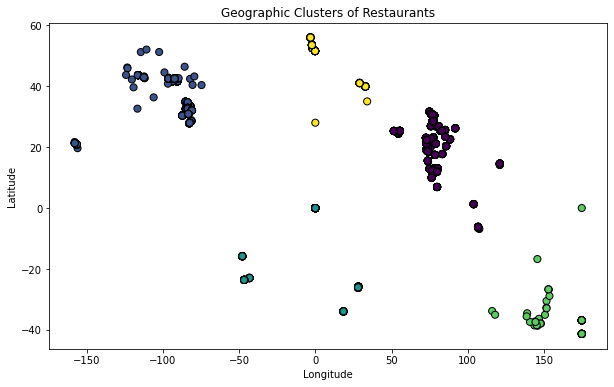

In [6]:
#  Identify any patterns or clusters of restaurants in specific areas
# Extract the coordinates
coords = df[[latitude_col, longitude_col]].values

# Use KMeans to find clusters
kmeans = KMeans(n_clusters=5, random_state=42)
df['Cluster'] = kmeans.fit_predict(coords)

# Plot the clusters
plt.figure(figsize=(10, 6))
plt.scatter(df[longitude_col], df[latitude_col], c=df['Cluster'], cmap='viridis', marker='o', edgecolor='k', s=50)
plt.title('Geographic Clusters of Restaurants')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

#Task 4:Restaurant Chains

In [7]:
# Identify if there are any restaurant chains present in the dataset

# Display the first few rows of the dataframe to understand its structure
print(df.head())

# Identify restaurant chains
restaurant_counts = df['Restaurant Name'].value_counts()

# Filter to keep only restaurant chains (restaurants that appear more than once)
chains = restaurant_counts[restaurant_counts > 1].index

# Create a new dataframe with only the restaurant chains
chains_df = df[df['Restaurant Name'].isin(chains)]

# Display the restaurant chains and their counts
print(chains_df['Restaurant Name'].value_counts())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [8]:
# Analyze the ratings and popularity of different restaurant chains
# Calculate the average rating and total votes for each restaurant chain
chain_analysis = chains_df.groupby('Restaurant Name').agg({
    'Aggregate rating': 'mean',
    'Votes': 'sum'
}).reset_index()

# Rename columns for better understanding
chain_analysis.columns = ['Restaurant Chain', 'Average Rating', 'Total Votes']

# Sort the chains by average rating and total votes
chain_analysis_sorted = chain_analysis.sort_values(by=['Average Rating', 'Total Votes'], ascending=False)

# Display the analysis
print(chain_analysis_sorted)

              Restaurant Chain  Average Rating  Total Votes
629           Talaga Sampireun           4.900         5514
8      AB's Absolute Barbecues           4.850         3151
589           Silantro Fil-Mex           4.850         1364
7    AB's - Absolute Barbecues           4.825        13400
449         Naturals Ice Cream           4.800         3094
..                         ...             ...          ...
440           Murliwala Bakers           0.000            0
538        Rajdhani Restaurant           0.000            0
616                Street Cafe           0.000            0
645              The Big Scoop           0.000            0
713               Whatslife.in           0.000            0

[734 rows x 3 columns]
